## Variations in $Ri_f$, $Γ$

Γ is potentially a large uncertainty in $J_q^ε$. Lets try the analysis of Monismith et al (2016). Definitions:

\begin{align*}
Ri_f &= \frac{B}{B + ε} \\
Re_b &= \frac{ε}{νN^2} \\
B &= \frac{χ}{2} \frac{N^2}{T_z^2}  = K_Tb_z \\
Γ &= \frac{Ri_f}{1 - Ri_f}
\end{align*}


I'm calculating these after 
1. thorpe-sorting T, S, ε, χ by ρ, 
1. then averaging to 1Hr, 
1. then fitting slopes or calculating means in 5m bins

Averaging tends to raise mean $Ri_f$ values for TIWE.

I'll look at EQUIX and TIWE.

Quoting Monismith et al (2016):
> more generally B + ε represents the net supply of TKE including tke production $P$, vertical divergence of TKE flux, and the rate of change of TKE with time.

Ivey et al (2008) say the following but the data is from Shi et al (2005) so do we still believe this?
> Both laboratory and DNS work indicate that at these extremes, when either $ε/ν N^2$ ∼ O(1) or $ε/νN^2 ∼ O(10^5)$, the mixing efficiency $Ri_f$ → 0 and the use of large $Ri_f ≈ 0.2$ in field situations in these limits cannot be justified.

In [ ]:
%load_ext watermark
%load_ext snakeviz
%matplotlib inline


import glob
import os

import cf_xarray as cfxr
import datatree
import dcpy
import distributed
import flox.xarray
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from dcpy.oceans import read_osu_microstructure_mat, thorpesort
from IPython.display import Image

# import eddydiff as ed
import pump

xr.set_options(keep_attrs=True)
mpl.rcParams["figure.dpi"] = 140

%watermark -iv

numpy      : 1.21.5
matplotlib : 3.5.1
cf_xarray  : 0.7.0
distributed: 2022.3.0
xarray     : 2022.3.0
dcpy       : 0.2.1.dev4+g05012cc.d20220325
pump       : 0.1
datatree   : 0.0.2.dev1+g2503606.d20220325
flox       : 0.4.1.dev11+gd895625.d20220401
hvplot     : 0.7.3



In [ ]:
equix_ = xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/equix.nc"))
equix_.attrs["name"] = "EQUIX"
tiwe_ = (
    xr.load_dataset(os.path.expanduser("~/datasets/microstructure/osu/tiwe.nc"))
    .drop_vars(["latitude", "longitude"])
    .sel(depth=slice(200))
)
tiwe_.attrs["name"] = "TIWE"

pump.calc.add_mixing_diagnostics(equix_, nbins=51)
pump.calc.add_mixing_diagnostics(tiwe_, nbins=51)

In [ ]:
# pump.calc.add_mixing_diagnostics(tiwe_, nbins=51)
equix = pump.micro.make_clean_dataset(equix_)
tiwe = pump.micro.make_clean_dataset(tiwe_)

/Users/dcherian/work/python/flox/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)
/Users/dcherian/work/python/flox/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray/core/nputils.py:169: RankWarning: Polyfit may be poorly conditioned
  warn_on_deficient_rank(rank, x.shape[1])
/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/xarray

## Above vs below EUC distributions

This started as a crude attempt to parition the data into "within DCL" and "outside DCL". 

But that approximation only works for EQUIX. TIWE is quite different! (see next section on  timeseries)

Note that calculating $Ri_f$  with averaged quantities makes some  difference for TIWE.

Text(0.5, 0.98, 'Using averaging')

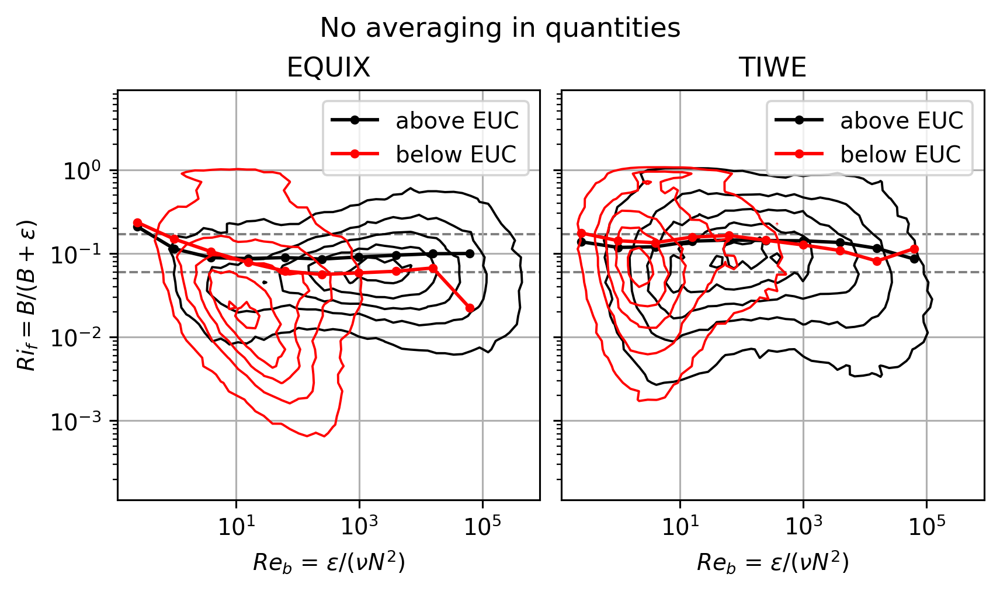

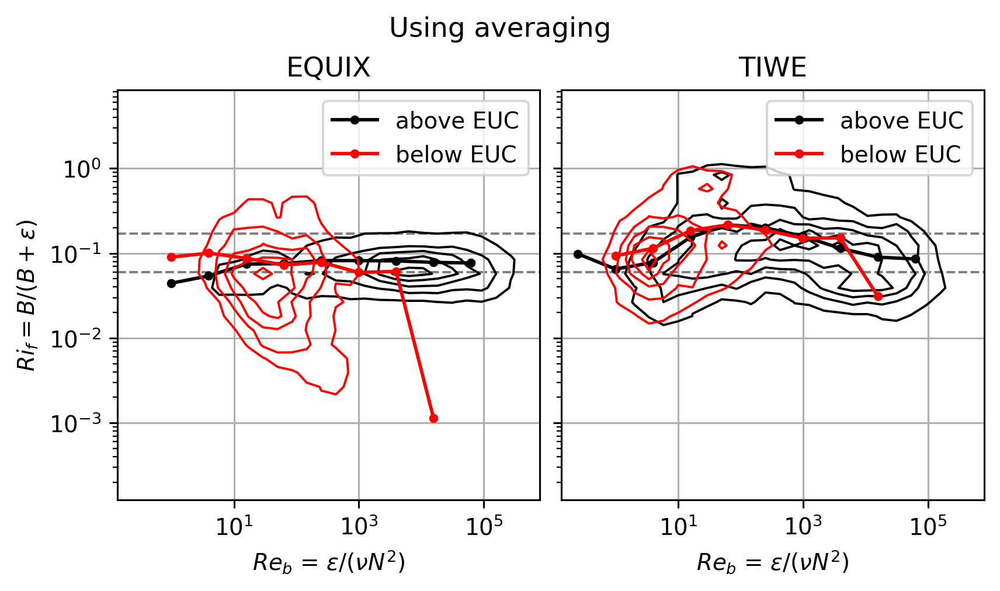

In [ ]:
f, ax = plt.subplots(1, 2, sharex=True, sharey=True, constrained_layout=True)
pump.plot.plot_reb_rif_euc_bins(equix_, ax=ax[0])
pump.plot.plot_reb_rif_euc_bins(tiwe_, ax=ax[1])
f.set_size_inches((6, 3.5))
dcpy.plots.clean_axes(ax)
f.suptitle("No averaging in quantities")

f, ax = plt.subplots(1, 2, sharex=True, sharey=True, constrained_layout=True)
pump.plot.plot_reb_rif_euc_bins(equix, ax=ax[0])
pump.plot.plot_reb_rif_euc_bins(tiwe, ax=ax[1])
f.set_size_inches((6, 3.5))
dcpy.plots.clean_axes(ax)
f.suptitle("Using averaging")

I think the combined dataset without paritioning by EUC max is a better view:
1. This figure relies on $Re_b$ to pick out the DCL I guess.
2. EQUIX totally dominates TIWE for  $Re_b$ > 1000, so there might still be value in plotting each expt separately  after  paritioning at DCL depth

The errorbars are too small to be seen in log-space in the first plot

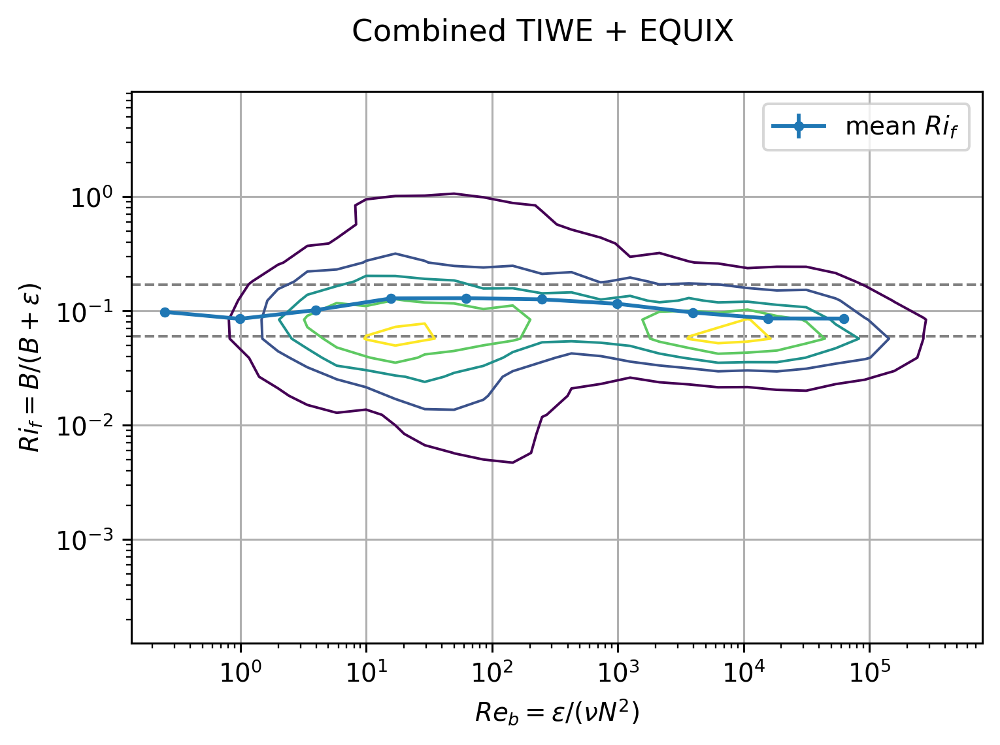

<Figure size 840x560 with 0 Axes>

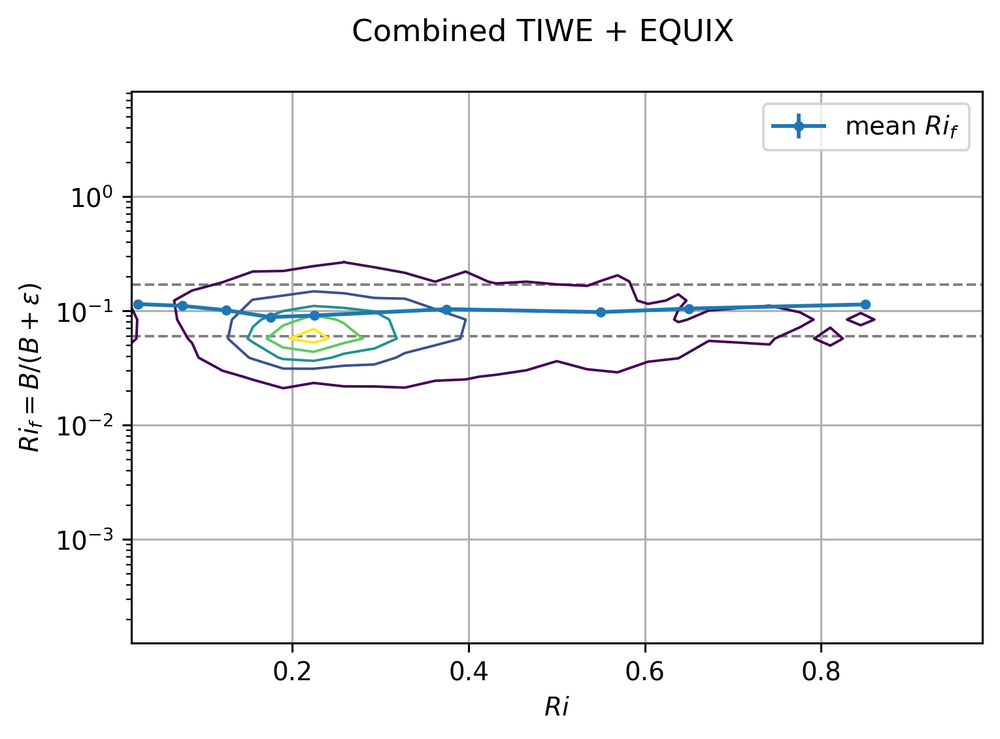

In [ ]:
def combined_average(*datasets, by, bins):
    import functools
    import operator

    combined = xr.Dataset()

    concat = xr.concat([ds[["Rif", by]] for ds in datasets], dim="time")
    flox_kwargs = dict(expected_groups=(bins,), isbin=(True,), fill_value=np.nan)

    for func in ["mean", "std", "count"]:
        combined[f"{func}_Rif"] = flox.xarray.xarray_reduce(
            concat, by, func=func, **flox_kwargs
        ).Rif

    if by == "Reb":
        combined["Rif_Reb_counts"] = functools.reduce(
            operator.add, (ds.Rif_Reb_counts for ds in datasets)
        ).sum("euc_bin")
        pump.plot.plot_rif_counts(combined.Rif_Reb_counts, x="Reb_bin", xscale="log")
    else:
        combined["Rif_Ri_counts"] = functools.reduce(
            operator.add, (ds.Rif_Ri_counts for ds in datasets)
        ).sum("euc_bin")
        pump.plot.plot_rif_counts(combined.Rif_Ri_counts, x="Ri_bin")

    plt.errorbar(
        x=[a.mid for a in combined[f"{by}_bins"].values],
        y=combined.mean_Rif,
        yerr=1.96 * combined.std_Rif / np.sqrt(combined.count_Rif),
        marker=".",
        label="mean $Ri_f$",
    )
    plt.suptitle("Combined TIWE + EQUIX")
    plt.legend()


combined_average(tiwe, equix, by="Reb", bins=tiwe.Reb_bins_2.data)
plt.figure()
combined_average(tiwe, equix, by="Ri", bins=[0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.5, 0.6, 0.7, 1])
#plt.yscale("linear")
#plt.ylim([0, 1])

## Distributions of  $Re_b$ and  $Ri_f$

Text(0.5, 0, 'log($Re_b$)')

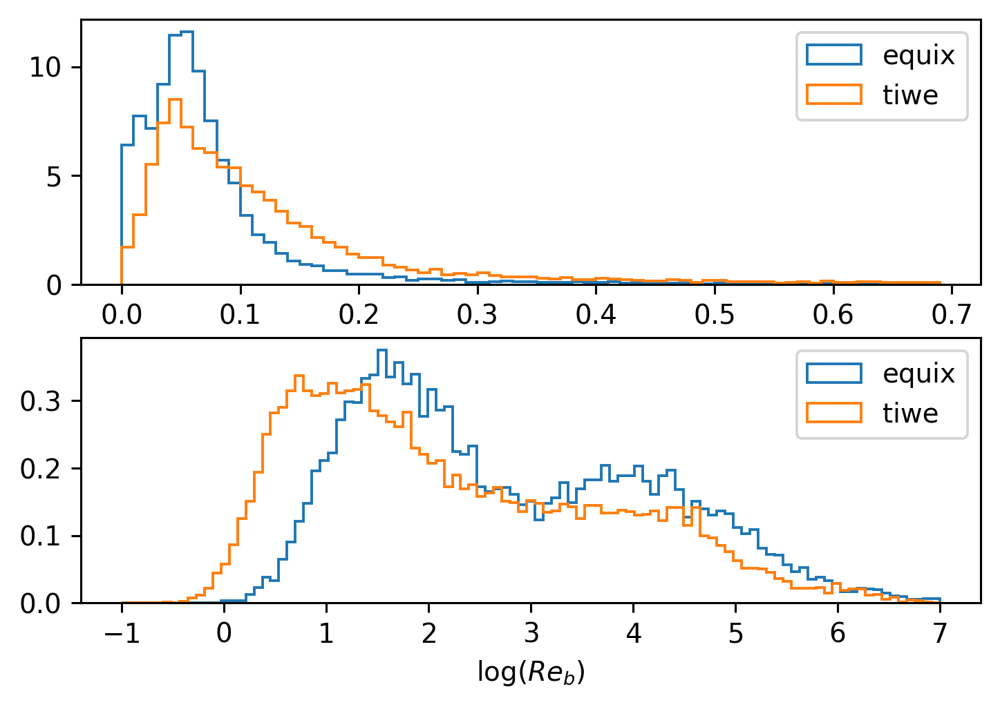

In [ ]:
f, ax = plt.subplots(2, 1, sharex=False, sharey=False)
kwargs = dict(bins=np.arange(0, 0.7, 0.01), histtype="step", density=True)
equix.Rif.plot.hist(**kwargs, label="equix", ax=ax[0])
tiwe.Rif.plot.hist(**kwargs, label="tiwe", ax=ax[0])
ax[0].legend()
ax[0].set_xlabel("$Ri_f$")

kwargs = dict(bins=np.linspace(-1, 7, 100), histtype="step", density=True)
np.log10(equix.Reb).plot.hist(**kwargs, label="equix", ax=ax[1])
np.log10(tiwe.Reb).plot.hist(**kwargs, label="tiwe", ax=ax[1])
ax[1].legend()
ax[1].set_xlabel("log($Re_b$)")

## Timeseries

These timeseries are more meaningful. Black contours are $Re_b$. White line is EUC max.

1. In TIWE, high $Ri_f$ is seen near the base of the "DCL" i.e. when $ε$ is generally low.
1. In EQUIX, $ε$ is relatively high all the way down to the EUC max (disregarding  details like upper  core layer etc). 
    1. There's a small amount of time on Nov. 4 where we see high $Ri_f$ but $Re_b$  looks about the same (but  note $Re_b$ is on a log  scale).
    1. TIWE Nov8-11; the DCL penetrates deeper, data indicate low $Ri_f$ which seems consistent with EQUIX.
1. TIWE Nov. 7 contradicts the previous point (high $ε$ at  deeper depths but high $Ri_f$)

posx and posy should be finite values
posx and posy should be finite values


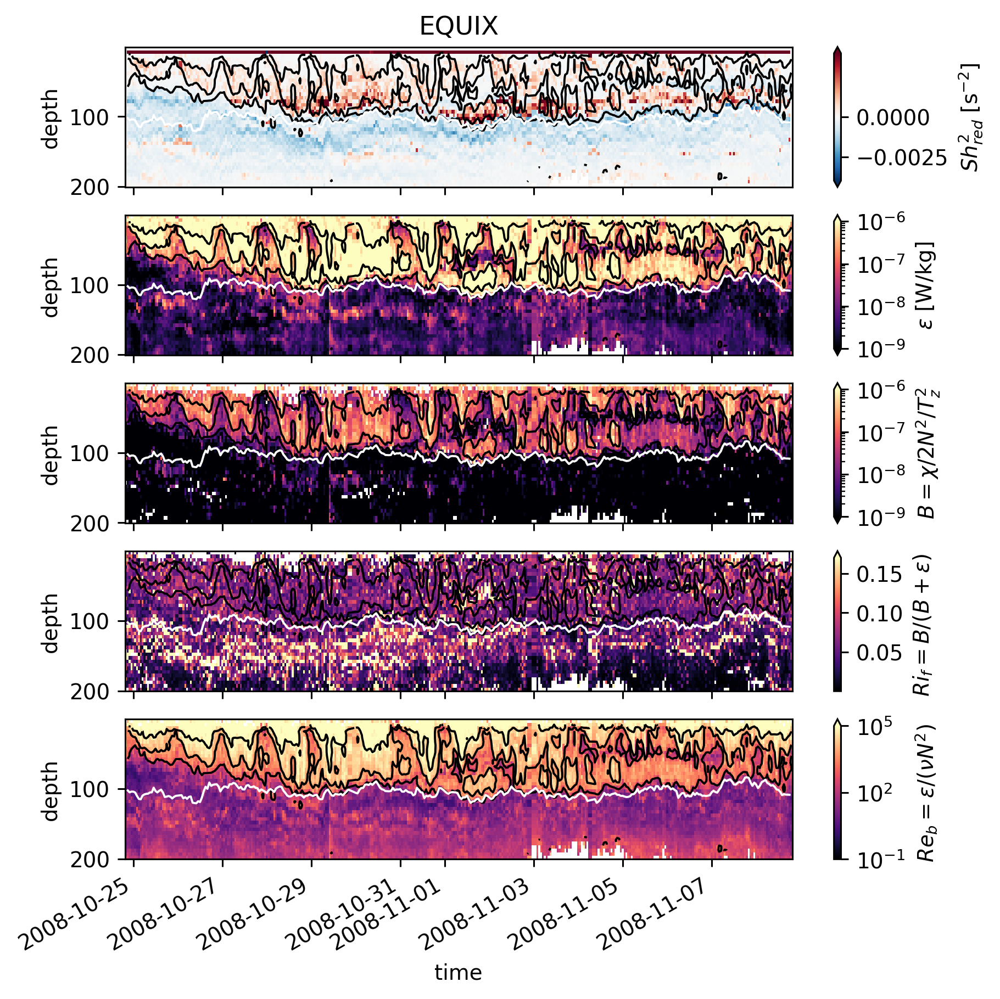

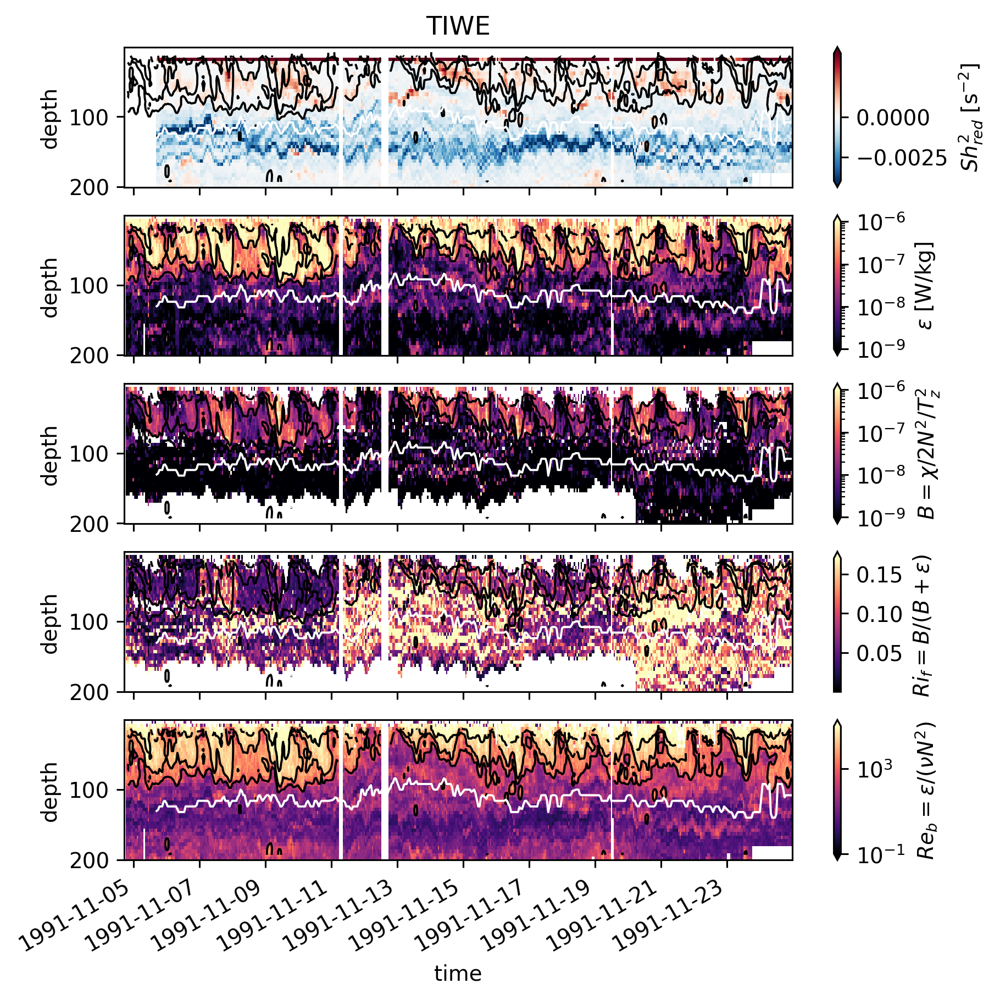

In [ ]:
pump.plot.plot_mixing_diagnostics_timeseries(equix, coarsen=False)
pump.plot.plot_mixing_diagnostics_timeseries(tiwe, coarsen=False)

## TIWE more closely

First I divide the timeseries into a few periods (period = time instants where red line is flat). Then look at profiles of quantities averaged over those  periods.

It turns out this is slightly misleading.

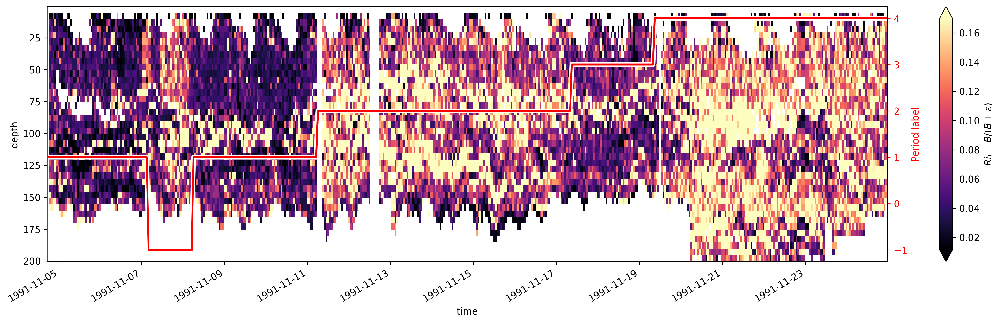

In [ ]:
section = xr.full_like(tiwe.eucmax, fill_value=np.nan)
section.attrs.clear()
section.attrs["long_name"] = "Period label"

breaks = [
    None,
    "1991-11-07 04:00",
    "1991-11-08 06:00",
    "1991-11-11 06:00",
    "1991-11-17 09:00",
    "1991-11-19 09:00",
    None,
]
labels = [1, -1, 1, 2, 3, 4]

for label, left, right in zip(labels, breaks[:-1], breaks[1:]):
    section.loc[{"time": slice(left, right)}] = label

tiwe.coords["section"] = section
tiwe.Rif.cf.plot(x="time", robust=True, cmap=mpl.cm.magma, vmax=0.17, size=5, aspect=4)

ax2 = plt.gca().twinx()
section.plot(ax=ax2, color="w", lw=5)
section.plot(ax=ax2, color="r", lw=2)
dcpy.plots.set_axes_color(ax2, "r")

1. It looks like the periods 1, 3, 4 (with the subsurface max in $Ri_f$) have a subsurface salinity max intrusion that might be limiting the deep-cycle. 
1. Period 2 where most of the water column has high $Ri_f$ looks weird in the profiles
    1. BUT note that the base of the DCL seems to change quite a bit so the averaging might be confusing things
    1. pretty broad Salinity intrusion below ~50m; $Ri_f$ is relatively higher.
1. Peak $Ri_f$ is just above the salinity max (or at the base of the DCL).
1. There is a strong gradient in ε, χ (base of the DCL)
1. But I see no signal of S intrusions in N^2?
1. Coincides with $Re_b$ decreasing below 10^3 threshold for periods 1, 4; for period 3 the $Re_b < 1000$
1. Nov 7. is similar to Nov 5-6;  8-11; in all fields except $χ$. **Was there a sensor change?**
1. Period 4 (after Nov. 20) has much higher χ (and higher $T_z$).

/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)
/var/folders/yp/rzgd0f7n5zbcbf5dg73sfb8ntv3xxm/T/ipykernel_12250/1338187074.py:27: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax["N2"].set_xlim([-1e-5, 1e-3])


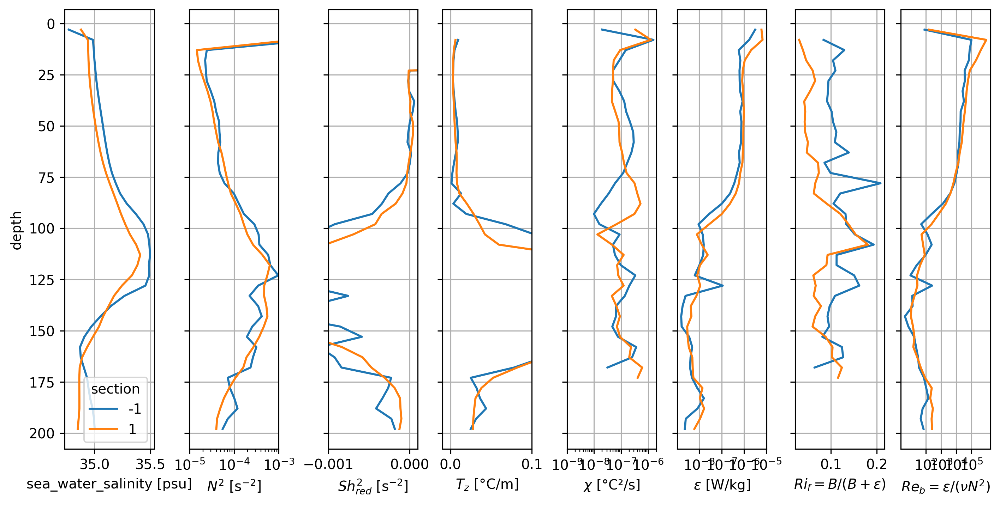

In [ ]:
grouped = flox.xarray.xarray_reduce(
    tiwe, "section", func="mean", expected_groups=[1, -1]
)

grouped.theta.attrs["long_name"] = "$θ$"
grouped["chi"] = grouped.chi.where(grouped.chi > 1e-9)
names = ["salt", "N2", "shred2", "dTdz", "chi", "eps", "Rif", "Reb"]
logx = ["chi", "eps", "Reb"]
linearx = ["Rif", "theta", "salt", "dTdz", "shred2"]
f, axx = plt.subplots(
    1, len(names), sharey=True, constrained_layout=True, squeeze=False
)
ax = dict(zip(names, axx.squeeze()))
for name, axis in ax.items():
    (grouped[name]).cf.plot.line(
        ax=axis,
        add_legend=name == names[0],
        xscale="linear" if name in linearx else "log",
    )
    axis.grid(True)
f.set_size_inches((10, 5))
dcpy.plots.clean_axes(axx)
ax["chi"].set_xticks([1e-9, 1e-8, 1e-7, 1e-6])
ax["eps"].set_xticks([1e-8, 1e-7, 1e-6, 1e-5])
ax["dTdz"].set_xlim([-1e-2, 1e-1])
ax["shred2"].set_xlim([-1e-3, 1e-4])
ax["N2"].set_xlim([-1e-5, 1e-3])
ax["Reb"].set_xticks([1e2, 1e3, 1e4, 1e5]);

/Users/dcherian/mambaforge/envs/pump/lib/python3.10/site-packages/flox/aggregate_flox.py:103: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)


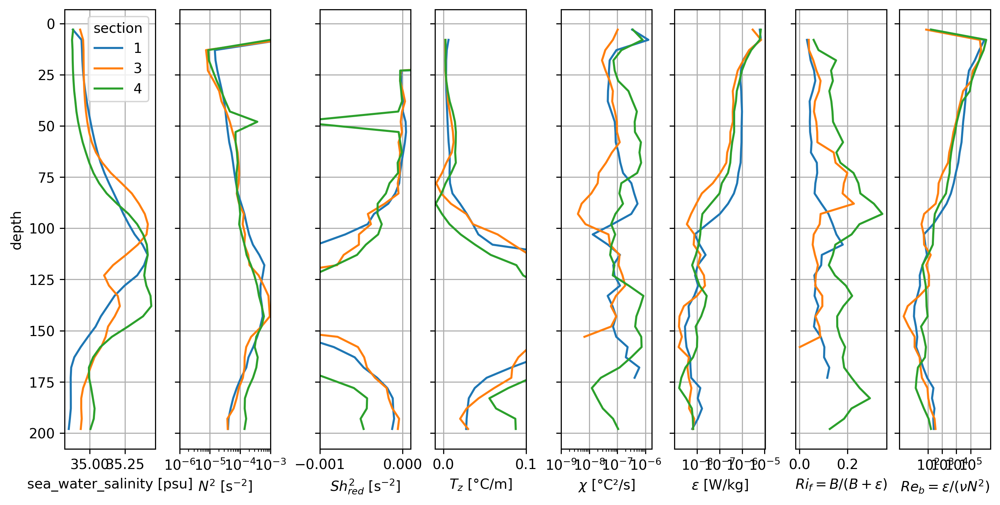

In [ ]:
grouped = flox.xarray.xarray_reduce(
    tiwe, "section", func="mean", expected_groups=[1, 3, 4]
)

grouped.theta.attrs["long_name"] = "$θ$"
grouped["chi"] = grouped.chi.where(grouped.chi > 1e-9)
names = ["salt", "N2", "shred2", "dTdz", "chi", "eps", "Rif", "Reb"]
logx = ["chi", "eps", "Reb"]
linearx = ["Rif", "theta", "salt", "dTdz", "shred2"]
f, axx = plt.subplots(
    1, len(names), sharey=True, constrained_layout=True, squeeze=False
)
ax = dict(zip(names, axx.squeeze()))
for name, axis in ax.items():
    (grouped[name]).cf.plot.line(
        ax=axis,
        add_legend=name == names[0],
        xscale="linear" if name in linearx else "log",
    )
    axis.grid(True)
f.set_size_inches((10, 5))
dcpy.plots.clean_axes(axx)
ax["chi"].set_xticks([1e-9, 1e-8, 1e-7, 1e-6])
ax["eps"].set_xticks([1e-8, 1e-7, 1e-6, 1e-5])
ax["dTdz"].set_xlim([-1e-2, 1e-1])
ax["shred2"].set_xlim([-1e-3, 1e-4])
ax["N2"].set_xlim([1e-6, 1e-3])
ax["Reb"].set_xticks([1e2, 1e3, 1e4, 1e5]);

TIWE dTdz is low, so it makes sense that salinity field is influencing DCL depth.

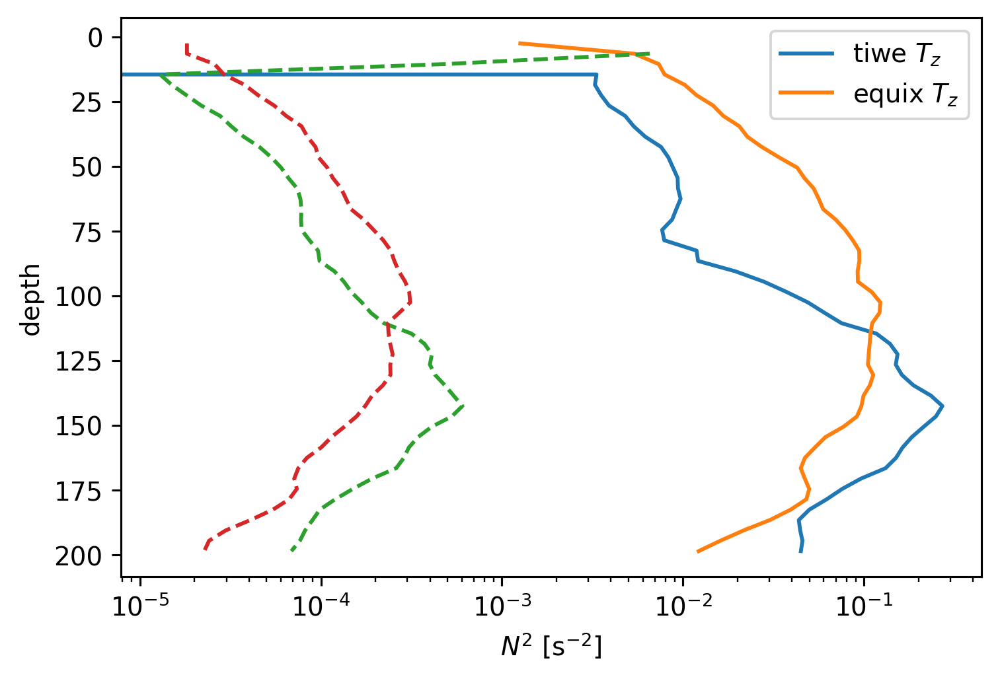

In [ ]:
tiwe.dTdz.mean("time").cf.plot.line(label="tiwe $T_z$")
equix.dTdz.mean("time").cf.plot.line(label="equix $T_z$")

tiwe.N2.mean("time").cf.plot.line(ls="--")
equix.N2.mean("time").cf.plot.line(xscale="log", ls="--")
plt.legend()

## A bunch of fields

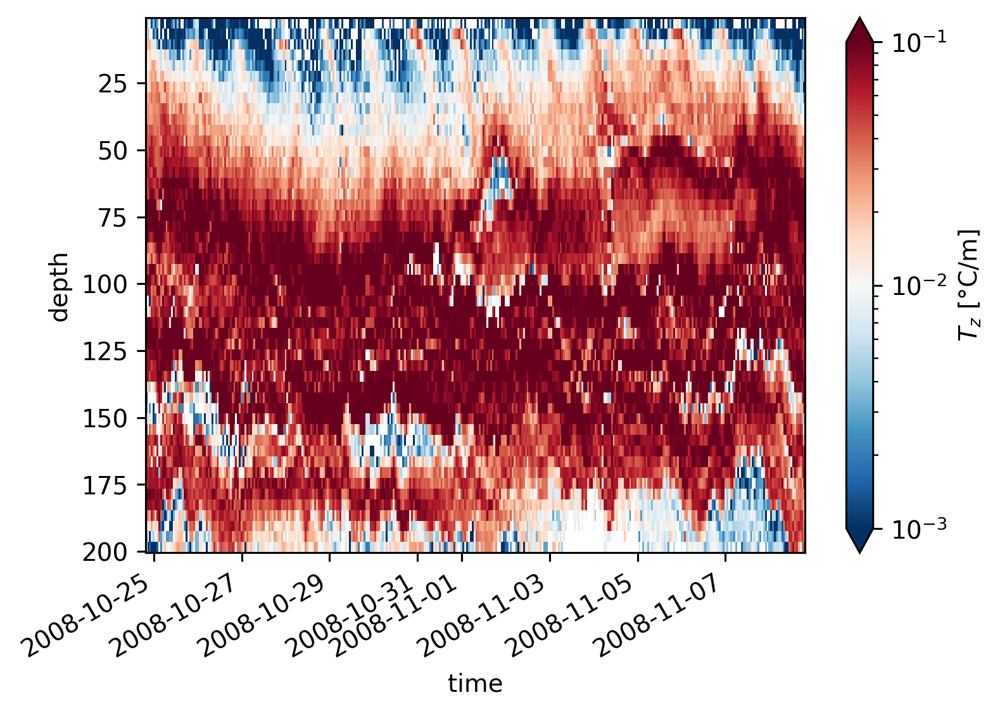

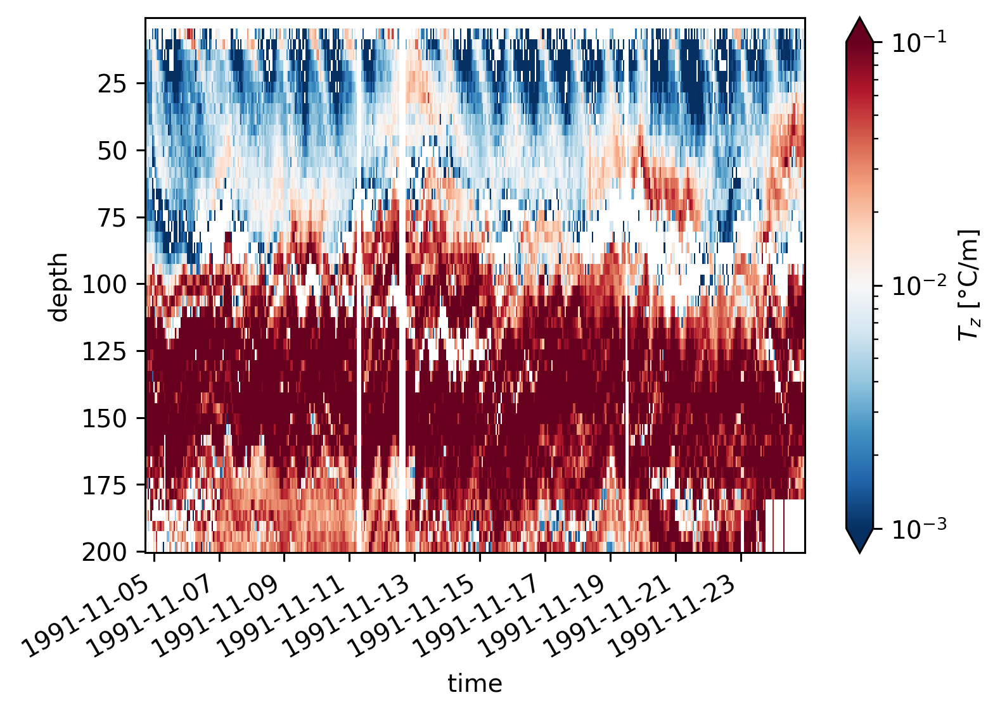

In [ ]:
equix.dTdz.cf.plot(norm=mpl.colors.LogNorm(1e-3, 1e-1))
plt.figure()
tiwe.dTdz.cf.plot(norm=mpl.colors.LogNorm(1e-3, 1e-1))

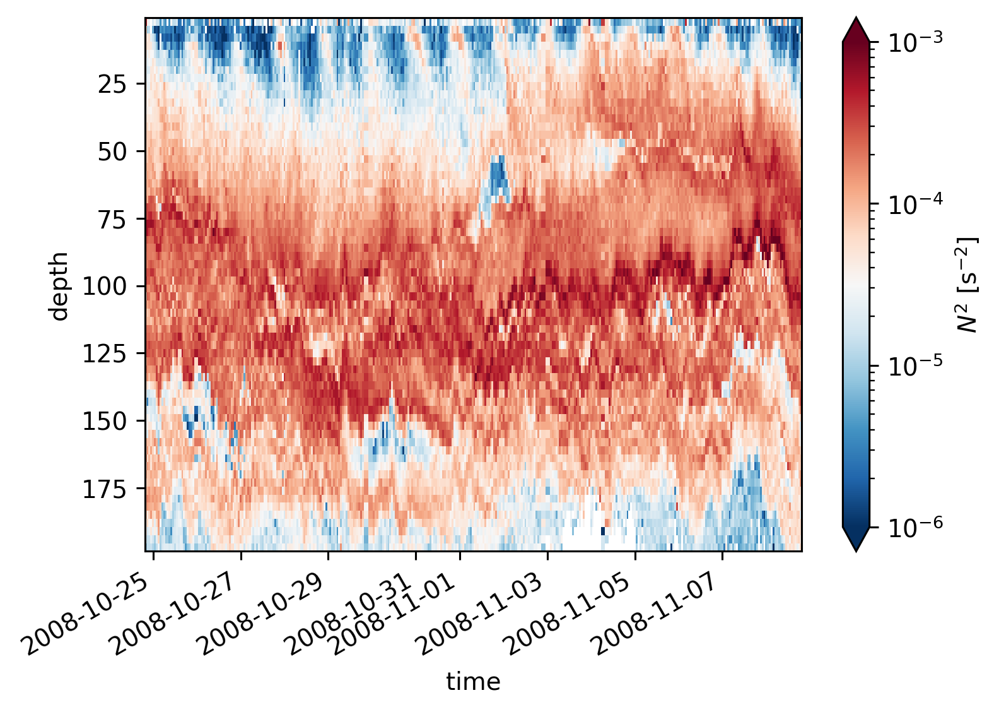

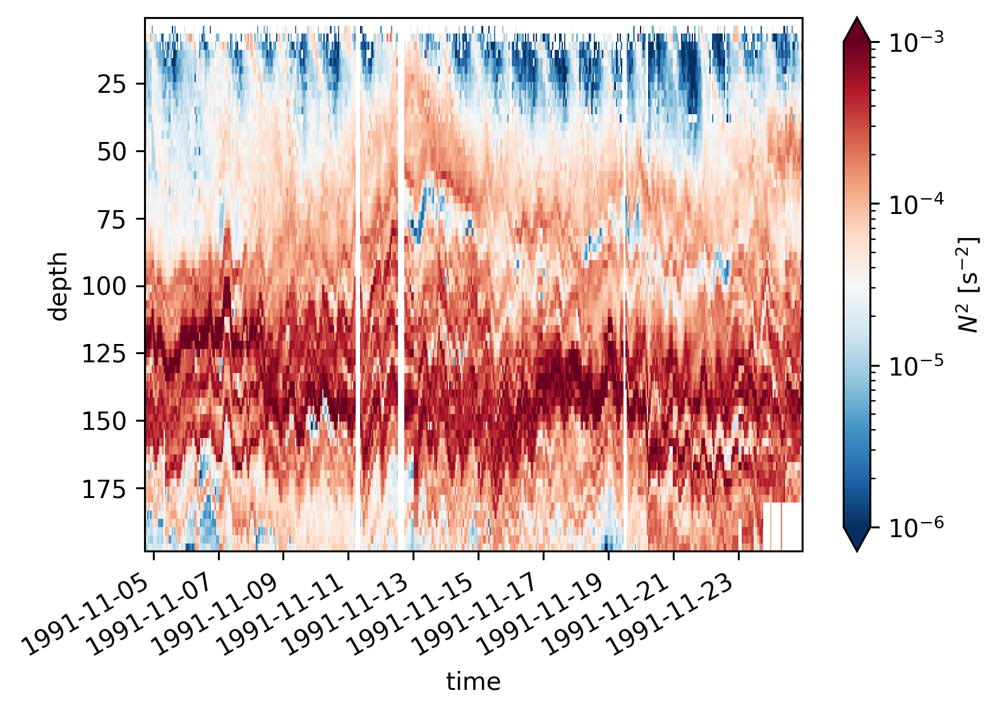

In [ ]:
equix.N2.cf.plot(norm=mpl.colors.LogNorm(1e-6, 1e-3))
plt.figure()
tiwe.N2.cf.plot(norm=mpl.colors.LogNorm(1e-6, 1e-3))

posx and posy should be finite values
posx and posy should be finite values


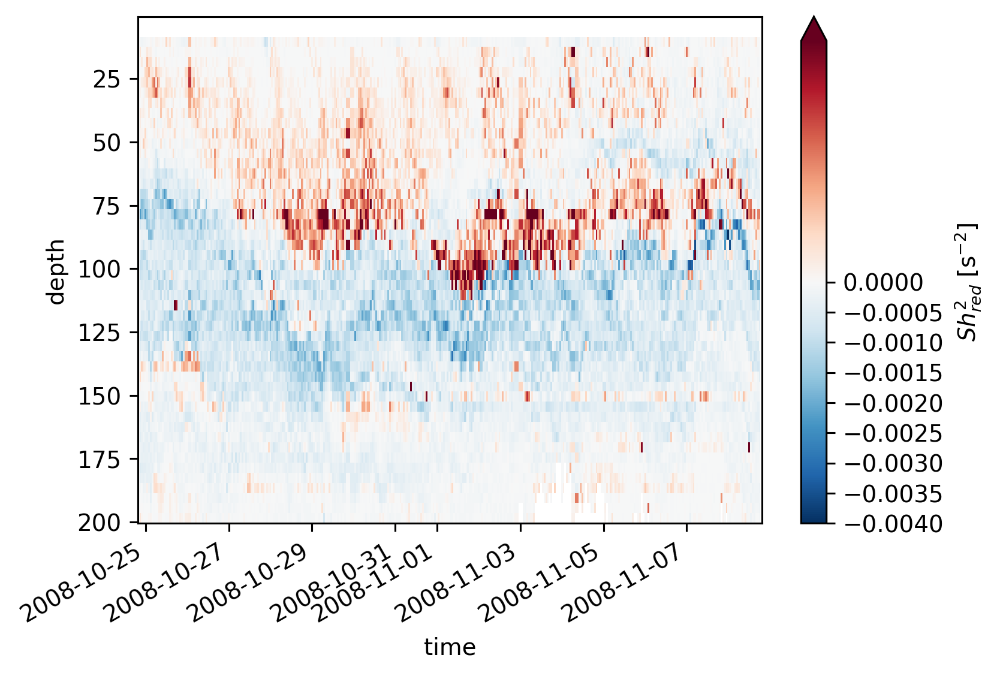

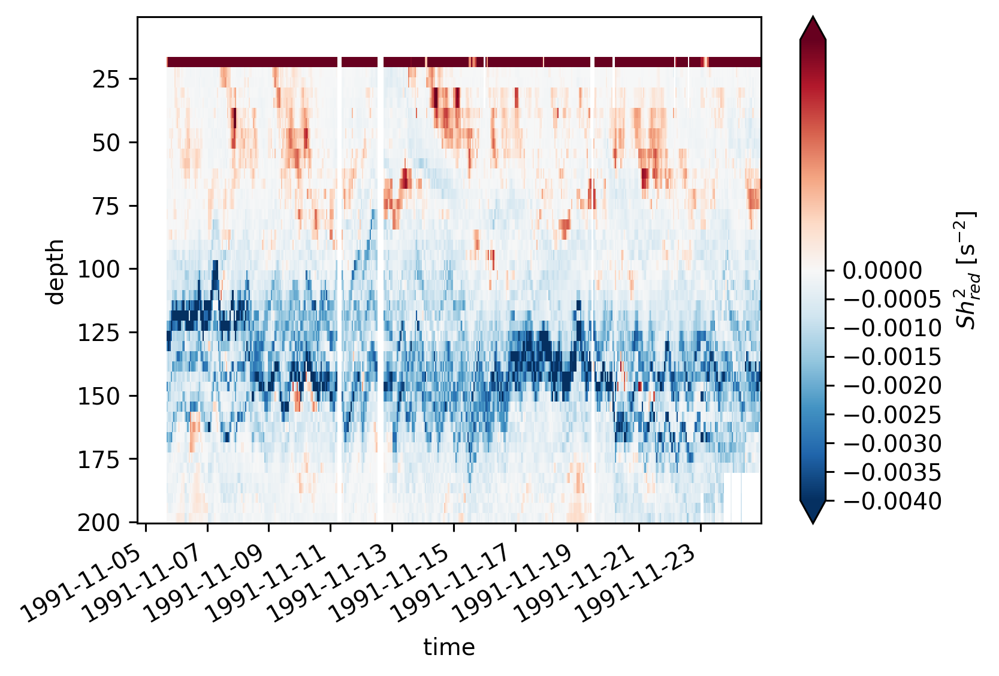

In [ ]:
equix.shred2.cf.plot(norm=mpl.colors.TwoSlopeNorm(vmin=-4e-3, vcenter=0, vmax=5e-4))
plt.figure()
tiwe.shred2.cf.plot(norm=mpl.colors.TwoSlopeNorm(vmin=-4e-3, vcenter=0, vmax=5e-4))